In [1]:
import anndata
import numpy as np
import sys
import torch
sys.path.insert(1, '../../../')
import velovae as vv
%load_ext autoreload
%autoreload 2

In [2]:
dataset = 'Braindev'
root = '/scratch/blaauw_root/blaauw1/gyichen'
adata = anndata.read_h5ad(f'{root}/data/velovae/continuous/{dataset}/{dataset}.h5ad')

In [3]:
#Uncomment this if data is not preprocessed
#vv.preprocess(adata, n_gene=2000, min_shared_counts=20, compute_umap=True)
#adata.write_h5ad(f'{dataset}_pp.h5ad')

In [3]:
model_path_base = f'{root}/checkpoints/{dataset}'
figure_path_base = f'{root}/figures/{dataset}'
data_path = f'{root}/data/velovae/brode/{dataset}'
gene_plot = ['Aldh1l1', 'Mapt', 'Myt1l', 'Lum']

# Branching ODE

Graph Partition
Number of partitions:  1
Computing type-to-type transition probability
Obtaining the MST in each partition
Initialization using type-specific dynamical model.
Learning Rate based on Data Sparsity: 0.0004
------------------------ Train a Branching ODE ------------------------
                 Ependymal  Fibroblast  Glioblast  Mesenchyme  Neural crest  Neural tube  Neuroblast  Neuron  Oligodendrocyte  Radial glia
Ependymal              0.0         0.0        0.0         0.0           0.0          0.0         0.0     0.0              0.0          1.0
Fibroblast             0.0         0.0        0.0         1.0           0.0          0.0         0.0     0.0              0.0          0.0
Glioblast              0.0         0.0        0.0         0.0           0.0          0.0         0.0     0.0              0.0          1.0
Mesenchyme             0.0         0.0        0.0         0.0           1.0          0.0         0.0     0.0              0.0          0.0
Neural crest 

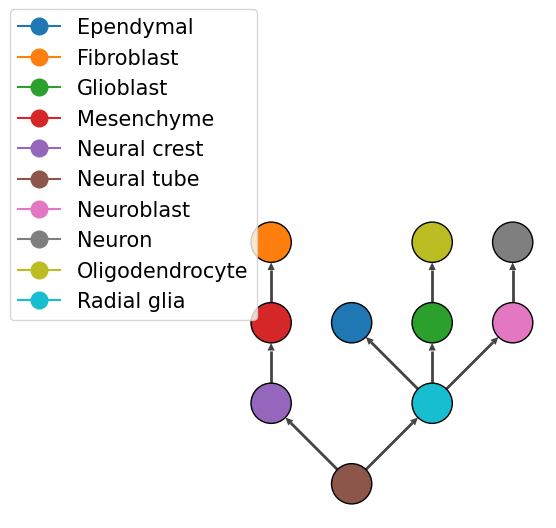

In [4]:
figure_path = f'{figure_path_base}/BrODE'
model_path = f'{model_path_base}/BrODE'

torch.manual_seed(2022)
np.random.seed(2022)
brode = vv.BrODE(adata,
                 'clusters',
                 'velovae_time',
                 'velovae_z',
                 param_key='velovae',
                 device='cuda:0')

brode.train(adata,
            'velovae_time',
            'clusters',
            plot=False,
            gene_plot=gene_plot,
            figure_path=figure_path)

brode.save_model(model_path, 'brode')
brode.save_anndata(adata, 'brode', data_path, file_name=f'{dataset}.h5ad')

vv.plot_transition_graph(adata, save=f'{figure_path_base}/transition.png')

# Evaluation

In [5]:
Ek = np.mean(adata.layers['brode_velocity_u']**2, 0) + np.mean(adata.layers['brode_velocity']**2, 0)
gidx = np.argsort(Ek)[-50:]

---   Plotting  Results   ---
computing velocity graph (using 14/32 cores)


  0%|          | 0/29948 [00:00<?, ?cells/s]

    finished (0:04:16) --> added 
    'brode_velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:08) --> added
    'brode_velocity_umap', embedded velocity vectors (adata.obsm)
saving figure to file /scratch/blaauw_root/blaauw1/gyichen/figures/Braindev/eval_brode_stream.png


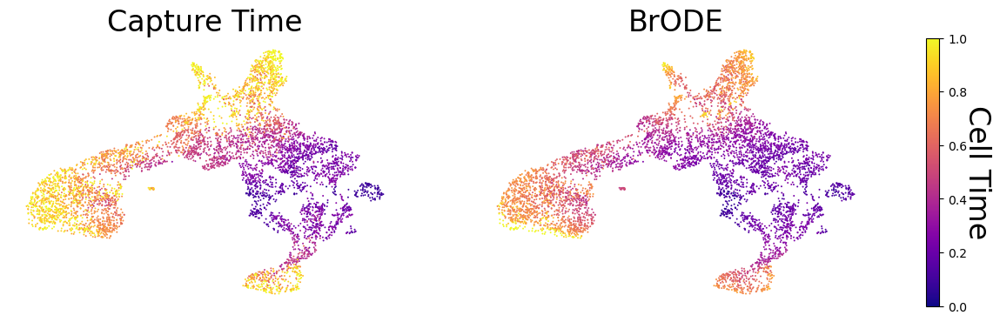

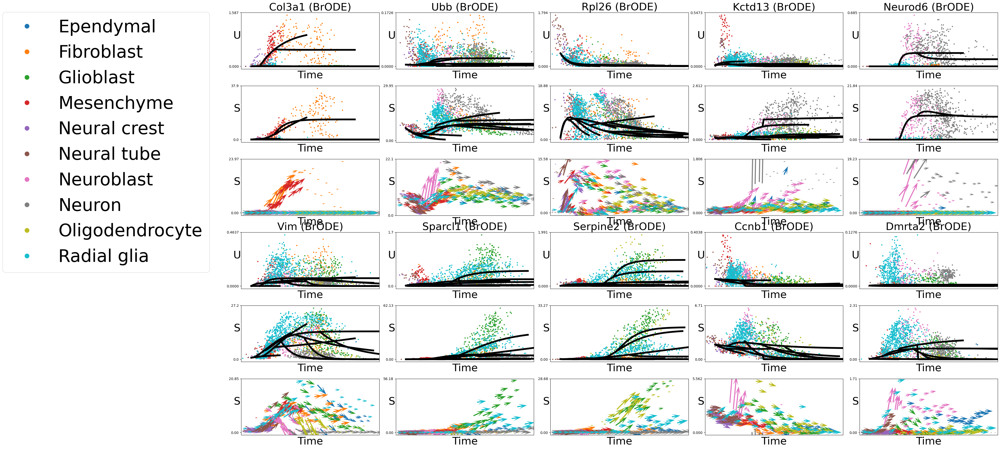

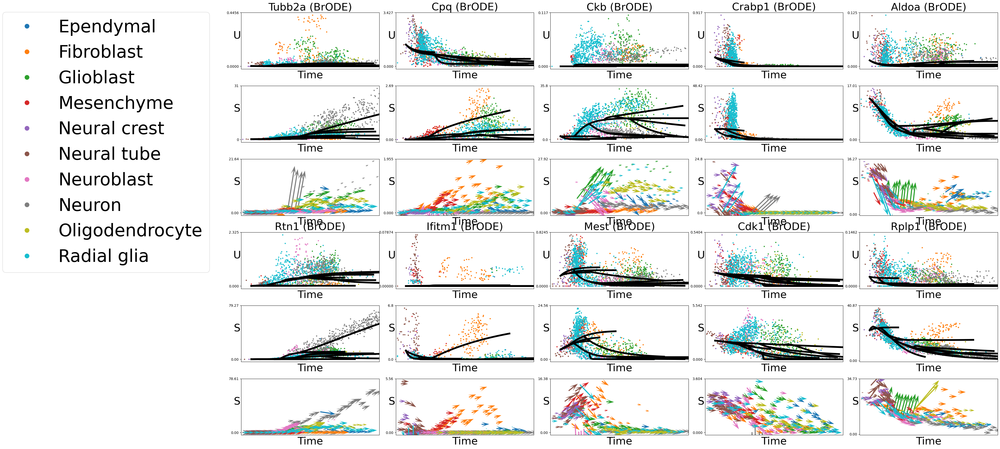

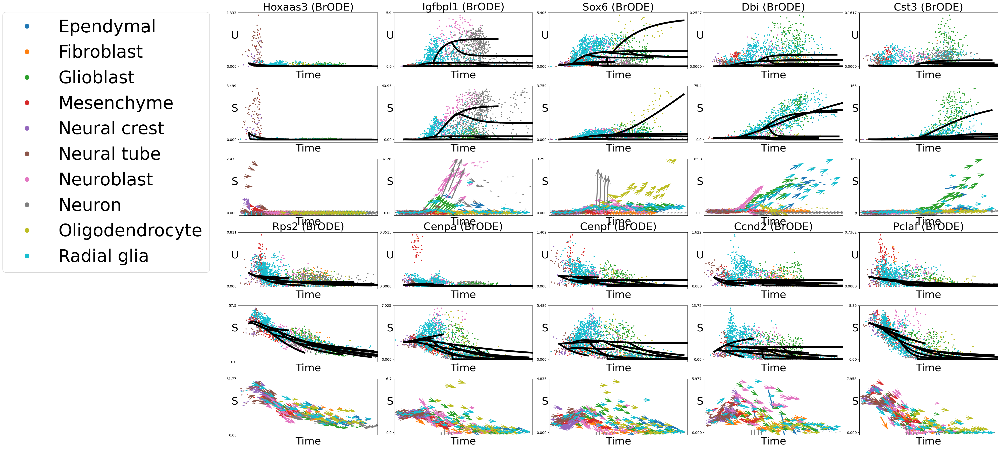

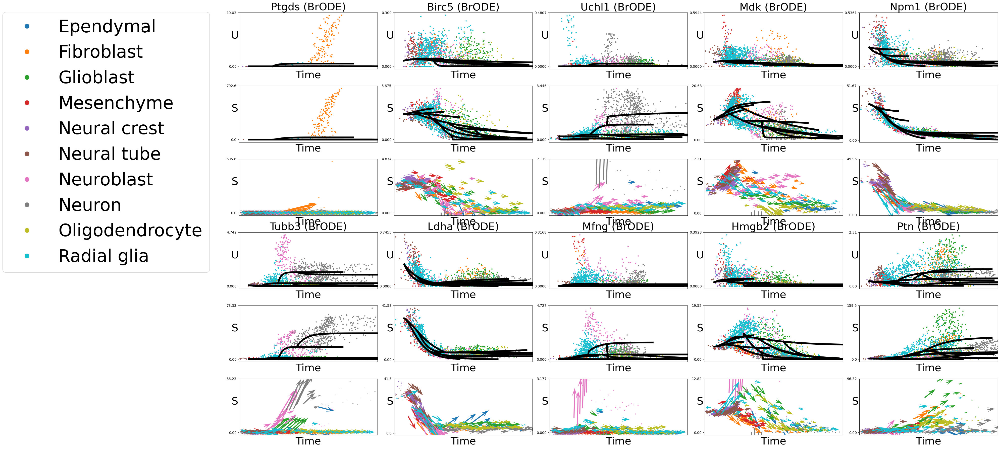

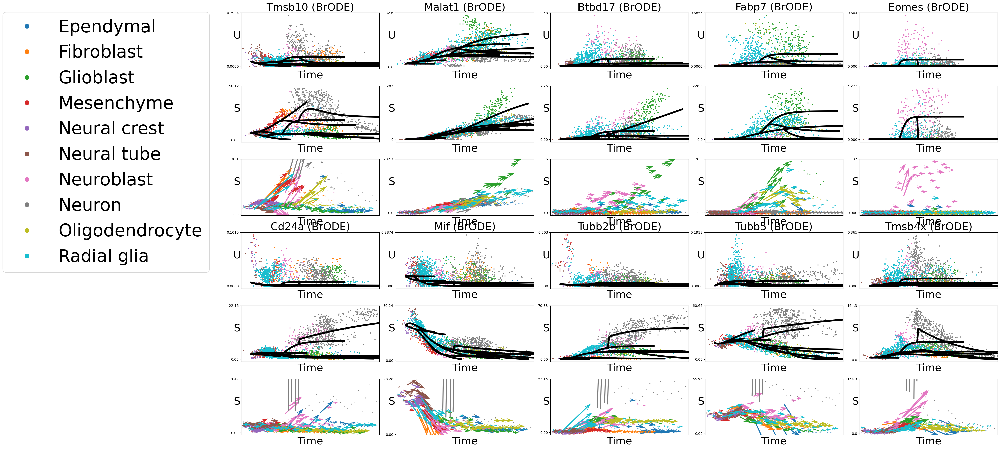

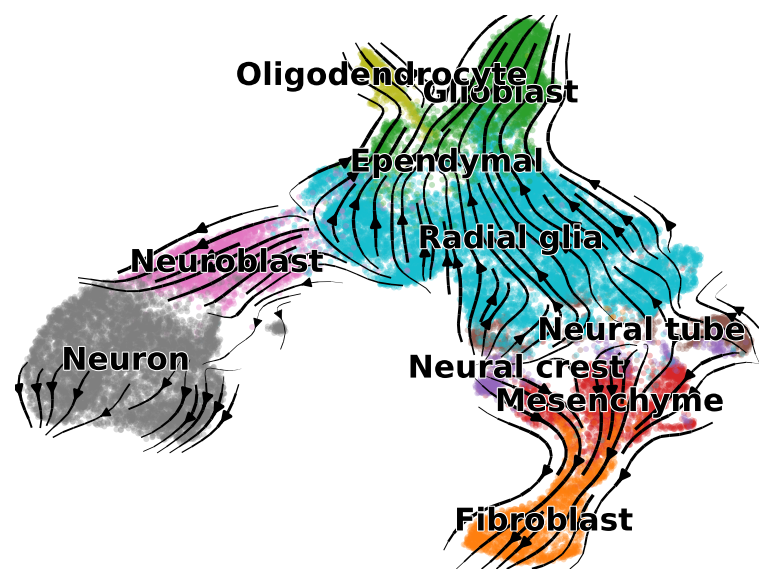

(None, None)

In [6]:
vv.post_analysis(adata,
                 'eval',
                 ['BrODE'],
                 ['brode'],
                 compute_metrics=False,
                 genes=adata.var_names[gidx],
                 grid_size=(2,5),
                 figure_path=figure_path_base)